# Neural Network Weights Visualization

Neural Networks at a high-level just consist of matrix multiplications at each layer. Matrix multiplications are linear transformations. This visualization shows the linear transformations at each layer and the loss landscape of each layer. This Notebook builds on top of the `Neural Network` Notebook. Look at the previous Notebook for the derivation of Backpropagation and the math behind neural networks.

Gavin's Note: The goal of this visualization is show that Backpropagation updates the weights and biases in the most optimal way. In order to visualize this, this program changes the weights to make them non optimal to show that the loss increases. As a result, this program will take a very long time.

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

# %matplotlib ipympl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from celluloid import Camera
import scienceplots
from IPython.display import Image

torch.manual_seed(0)
np.random.seed(0)
plt.style.use(["science", "no-latex"])

## Training Dataset

Let's generate a non-linear dataset, since neural networks can fit this function while linear models, such as a perceptron, can't converge on this dataset

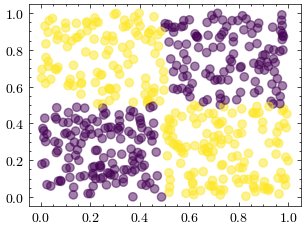

In [2]:
# generate the non-linear dataset, meaning that a hyperplane can't separate the data
def generate_XOR():
    N = 500
    X = np.random.rand(N, 2)
    y = (X[:, 0] > 0.5) != (X[:, 1] > 0.5)

    return X, y


X, y = generate_XOR()

fig = plt.figure()
ax = fig.add_subplot()
ax.scatter(X[:, 0], X[:, 1], c=y, alpha=0.5)

## Graph Functions

In our training function, we use the gradient descent optimizer to update the weights and move on. What if we didn't use the weights from the optimizer? These graphing functions manually change the values in the weight matrix of our neural network's layers and run the neural network to see how the loss changes. 

There are also graphing functions that show the linear transformation of each layer.

In [3]:
def create_scatterplots(rows=2, cols=3, width_scale=1, height_scale=1):
    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(16 / 9.0 * 4 * width_scale, 4 * height_scale),
        layout="constrained",
    )
    axes = axes.flatten()

    layer_idx = 0
    for i, axis in enumerate(axes):
        if not ((i + 1) % cols == 0):
            axis.set_title(f"Layer {layer_idx}")
            layer_idx += 1

    axes[-1].set_title("Predictions")
    axes[-1 - cols].set_title("Mean Squared Error")

    camera = Camera(fig)
    return axes, camera


def create_3d_plots(rows=2, cols=3, width_scale=1, height_scale=1):
    fig = plt.figure(
        figsize=(16 / 9.0 * 4 * width_scale, 4 * height_scale), layout="constrained"
    )
    axes = []

    layer_idx = 0
    for i in range(rows * cols):
        if not ((i + 1) % cols == 0):
            axis = fig.add_subplot(rows, cols, i + 1, projection="3d")
            axis.set_title(f"Layer {layer_idx + 1}")
            axes.append(axis)
            layer_idx += 1
        else:
            axes.append(fig.add_subplot(rows, cols, i + 1))

    axes[-1].set_title("Predictions")
    axes[-1 - cols].set_title("Mean Squared Error")

    camera = Camera(fig)
    return axes, camera


def plot_layer_loss_landscape(
    axis,
    model,
    target_layer_idx,
    neuron_idx,
    features,
    labels,
    w1_min,
    w1_max,
    w2_min,
    w2_max,
    loss_dims,
    device,
    color="blue",
):
    """Plot how the loss changes when the first two weights in the first neuron change"""
    loss_fn = nn.MSELoss()

    init = model.get_values(target_layer_idx, neuron_idx)
    w1 = init[0].item()
    w2 = init[1].item()

    target_layer_idx = target_layer_idx % len(model.layers)

    w1_range = torch.linspace(w1_min + w1, w1_max + w1, loss_dims).to(device)
    w2_range = torch.linspace(w2_min + w2, w2_max + w2, loss_dims).to(device)
    w1_range, w2_range = torch.meshgrid(w1_range, w2_range, indexing="ij")
    w_range = torch.stack((w1_range.flatten(), w2_range.flatten()), axis=1)

    error_range = np.array([])

    for target_layer_weight in w_range:
        model.override_layer_weight(
            target_layer_idx, neuron_idx, init + target_layer_weight
        )
        error = 0
        for x, y in zip(features, labels):
            output = model(x)
            y = y.unsqueeze(0)
            loss = loss_fn(output, y)
            error += loss.detach().cpu().numpy()
        error /= len(labels)
        error_range = np.append(error_range, error)

        if np.isclose(target_layer_weight[0].item(), w1, atol=0.25) and np.isclose(
            target_layer_weight[1].item(), w2, atol=0.25
        ):
            axis.scatter([w1], [w2], [error], color=color, alpha=0.4)

    axis.plot_surface(
        w1_range.detach().cpu().numpy(),
        w2_range.detach().cpu().numpy(),
        error_range.reshape(loss_dims, loss_dims),
        color=color,
        alpha=0.1,
    )
    model.override_layer_weight(target_layer_idx, neuron_idx, init)


def plot_mse_and_predictions(
    axes, features, idx, visible_mse, mse_idx, errors, predictions, cmap, cols, device
):
    features_cpu = features.detach().cpu().numpy()

    # Plot MSE
    mse_ax = axes[-1 - cols]
    mse_ax.plot(
        mse_idx[visible_mse][: idx + 1],
        errors[visible_mse][: idx + 1],
        color="red",
        alpha=0.5,
    )
    mse_ax.plot(
        [1],
        [0],
        color="white",
        alpha=0,
    )

    # Plot Predictions
    predictions_classes = np.where(predictions > 0.5, 1, 0)

    predictions_ax = axes[-1]
    predictions_ax.scatter(
        features_cpu[:, 0],
        features_cpu[:, 1],
        c=predictions_classes,
        cmap=cmap,
        alpha=0.5,
    )


def plot_transformations_and_predictions(
    axes,
    model,
    idx,
    visible_mse,
    mse_idx,
    errors,
    predictions,
    features,
    labels,
    cmap,
    rows,
    cols,
    device,
):
    plot_mse_and_predictions(
        axes,
        features,
        idx,
        visible_mse,
        mse_idx,
        errors,
        predictions,
        cmap,
        cols,
        device,
    )
    model.visualize(features, labels, axes, cmap, rows, cols)


def plot_loss_landscape_and_predictions(
    axes,
    model,
    idx,
    visible_mse,
    mse_idx,
    errors,
    predictions,
    features,
    labels,
    cmap,
    cols,
    device,
    w1_min=-5,
    w1_max=5,
    w2_min=-5,
    w2_max=5,
    loss_dims=7,
):
    # this uses axes with index -1 and -1-cols
    plot_mse_and_predictions(
        axes,
        features,
        idx,
        visible_mse,
        mse_idx,
        errors,
        predictions,
        cmap,
        cols,
        device,
    )

    num_layers = len(model.layers)

    target_layer_idx = -1

    for index, axis in enumerate(reversed(axes)):
        # in reverse order, predictions plot is index 0 and mse plot is index cols
        if index == 0 or index == cols or abs(target_layer_idx) > num_layers:
            continue
        plot_layer_loss_landscape(
            axis,
            model,
            target_layer_idx,
            0,
            features,
            labels,
            w1_min,
            w1_max,
            w2_min,
            w2_max,
            loss_dims,
            device,
            color="blue",
        )
        if target_layer_idx != -1:
            plot_layer_loss_landscape(
                axis,
                model,
                target_layer_idx,
                1,
                features,
                labels,
                w1_min,
                w1_max,
                w2_min,
                w2_max,
                loss_dims,
                device,
                color="red",
            )
        target_layer_idx -= 1

## PyTorch Implementation

Let's define a feedforward neural network in PyTorch, but add custom functions to each layer that manually change the weight values. We want to use this function to see how the loss changes when the weights aren't at the optimal value. This is used to show that Backpropagation tells us how to update the weights optimally.

In [4]:
class VisualNet(nn.Module):
    def __init__(self):
        super(VisualNet, self).__init__()
        self.layers = nn.ModuleList()

    def visualize(self, X, y, axes, cmap, rows, cols):
        y_cpu = y.detach().cpu().numpy()

        layer_idx = 0
        for i, axis in enumerate(axes):
            if not ((i + 1) % cols == 0):
                X_cpu = X.detach().cpu().numpy()

                # input and hidden layer outputs
                if X.shape[1] != 1:
                    axis.scatter(
                        X_cpu[:, 0], X_cpu[:, 1], c=y_cpu, cmap=cmap, alpha=0.5
                    )
                # output layer is 1D, so set second dimenstional to zeros
                else:
                    axis.scatter(
                        X_cpu[:, 0],
                        np.zeros(X_cpu[:, 0].shape),
                        c=y_cpu,
                        cmap=cmap,
                        alpha=0.5,
                    )

                if layer_idx < len(self.layers):
                    X = F.tanh(self.layers[layer_idx](X))
                    layer_idx += 1

    def override_layer_weight(self, layer_idx, neuron_idx, new_weights):
        if (abs(layer_idx) > len(self.layers)) or (
            abs(neuron_idx) > len(self.layers[layer_idx].weight)
        ):
            return

        with torch.no_grad():
            self.layers[layer_idx].weight[neuron_idx, :2] = new_weights

    def get_values(self, layer_idx, neuron_idx):
        if (abs(layer_idx) > len(self.layers)) or (
            abs(neuron_idx) > len(self.layers[layer_idx].weight)
        ):
            return torch.zeros(2)

        with torch.no_grad():
            return self.layers[layer_idx].weight.detach().clone()[neuron_idx, :2]


class TorchNet(VisualNet):
    def __init__(self, num_hidden_layers):
        super().__init__()

        # define the layers
        self.input_layer = nn.Linear(2, 2)
        self.layers.append(self.input_layer)

        for i in range(num_hidden_layers):
            self.layers.append(nn.Linear(2, 2))

        self.output_layer = nn.Linear(2, 1)
        self.layers.append(self.output_layer)

    def forward(self, x):
        # pass the result of the previous layer to the next layer
        for layer in self.layers[:-1]:
            x = F.tanh(layer(x))

        return self.output_layer(x)

## Training the Model

Similar to the previous Neural Network Notebook, let's pass in the training data to our model, update the weights with our optimizer, and update our visualization

In [5]:
def torch_fit(
    model,
    features,
    labels,
    epochs,
    learning_rate,
    transformations_plot_filename,
    loss_landscape_plot_filename,
    device,
    rows=2,
    cols=3,
    width_scale=1,
    height_scale=1,
):
    mse_idx = np.arange(1, epochs + 1)
    errors = np.full(epochs, -1)

    cmap = plt.cm.colors.ListedColormap(["red", "blue"])

    scatterplots, camera1 = create_scatterplots(rows, cols, width_scale, height_scale)
    loss_plots, camera2 = create_3d_plots(rows, cols, width_scale, height_scale)

    loss_fn = nn.MSELoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.3)

    for idx in range(epochs):
        error = 0
        predictions = np.array([])

        for x, y in zip(features, labels):
            # Forward Propagation
            output = model(x)

            output_np = output.detach().cpu().numpy()
            predictions = np.append(predictions, output_np)

            # Store Error
            # tensor(0.) -> tensor([0.]) to match shape of output variable
            y = y.unsqueeze(0)
            loss = loss_fn(output, y)

            error += loss.detach().cpu().numpy()

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        if (
            idx < 5
            or (idx <= 50 and idx % 5 == 0)
            or (idx <= 1000 and idx % 50 == 0)
            or idx % 250 == 0
        ):
            print(f"epoch: {idx}, MSE: {error}")

            # Plot MSE
            errors[idx] = error
            visible_mse = errors != -1

            plot_transformations_and_predictions(
                scatterplots,
                model,
                idx,
                visible_mse,
                mse_idx,
                errors,
                predictions,
                features,
                labels,
                cmap,
                rows,
                cols,
                device,
            )

            plot_loss_landscape_and_predictions(
                loss_plots,
                model,
                idx,
                visible_mse,
                mse_idx,
                errors,
                predictions,
                features,
                labels,
                cmap,
                cols,
                device,
            )

            camera1.snap()
            camera2.snap()

    animation1 = camera1.animate()
    animation1.save(transformations_plot_filename, writer="pillow")
    animation2 = camera2.animate()
    animation2.save(loss_landscape_plot_filename, writer="pillow")

    plt.show()

## Visualize the transformations and weight updates

Let's call our training function with our model to create the visualization.

epoch: 0, MSE: 137.9026336669922
epoch: 1, MSE: 127.58297729492188
epoch: 2, MSE: 127.3271713256836
epoch: 3, MSE: 127.13655853271484
epoch: 4, MSE: 126.98948669433594
epoch: 5, MSE: 126.87287139892578
epoch: 10, MSE: 126.53106689453125
epoch: 15, MSE: 126.36543273925781
epoch: 20, MSE: 126.266357421875
epoch: 25, MSE: 126.19721984863281
epoch: 30, MSE: 126.14079284667969
epoch: 35, MSE: 126.08564758300781
epoch: 40, MSE: 126.01984405517578
epoch: 45, MSE: 125.92532348632812
epoch: 50, MSE: 125.76524353027344
epoch: 100, MSE: 95.95246124267578
epoch: 150, MSE: 56.10152053833008
epoch: 200, MSE: 54.98665237426758
epoch: 250, MSE: 38.98552703857422
epoch: 300, MSE: 20.435640335083008
epoch: 350, MSE: 13.933258056640625
epoch: 400, MSE: 11.308575630187988
epoch: 450, MSE: 9.152091979980469
epoch: 500, MSE: 7.561526298522949
epoch: 550, MSE: 6.4366888999938965
epoch: 600, MSE: 5.587584018707275


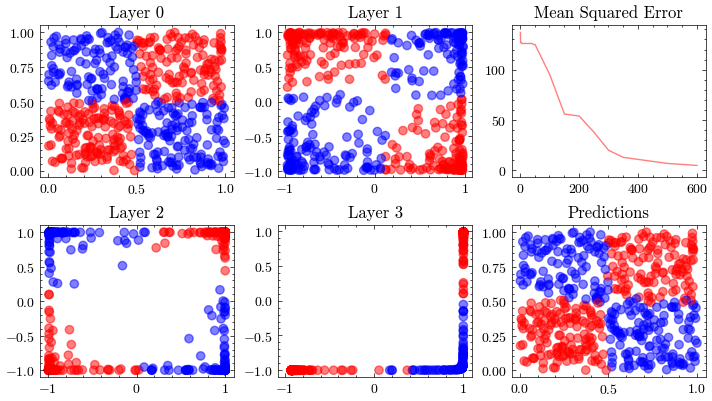

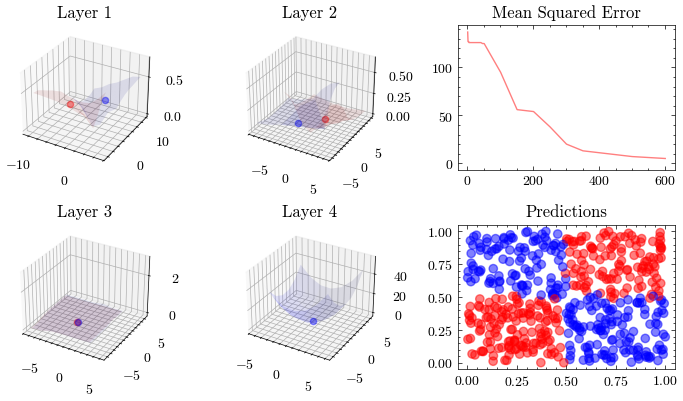

In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
torch_model = TorchNet(num_hidden_layers=2).to(device)

rows = 2
cols = 3

# the inputs and outputs for PyTorch must be tensors
X_tensor = torch.tensor(X, device=device, dtype=torch.float32).squeeze(-1)
y_tensor = torch.tensor(y, device=device, dtype=torch.float32).squeeze(-1)

epochs = 601
learning_rate = 0.005

transformations_plot_filename = "neural_network_weights.gif"
loss_landscape_plot_filename = "neural_network_weights_loss_landscape.gif"
torch_fit(
    torch_model,
    X_tensor,
    y_tensor,
    epochs,
    learning_rate,
    transformations_plot_filename,
    loss_landscape_plot_filename,
    device,
    rows=rows,
    cols=cols,
)

This visualization shows the internal linear transformation of each layer in the neural network. We will show each layer transform an input to an output. At the 3rd layer, the data becomes linearly separable. As a result of these transformations, the network is able to classify inputs into these two classes.

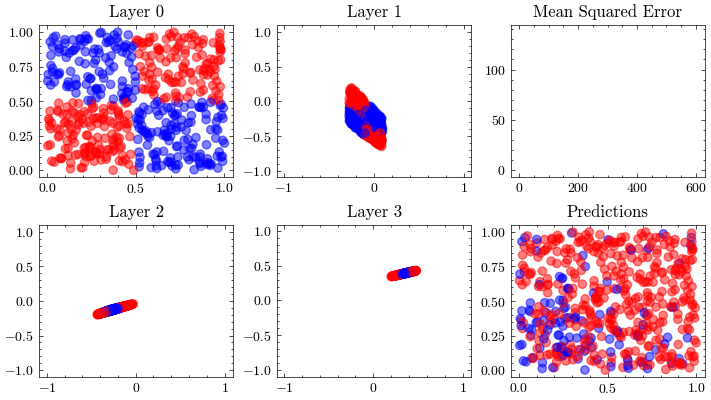

In [7]:
Image(filename=transformations_plot_filename)

This visualization shows that the weights all update together such that the loss function at the last layer reaches the minima. See how the 3D plot in layer 4 is at a minima.

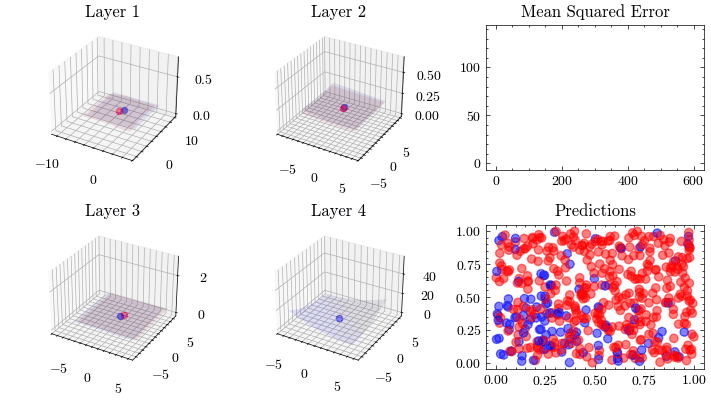

In [8]:
Image(filename=loss_landscape_plot_filename)

## Vanishing Gradients

It's a valid assumption that increasing the number of layers of a neural network allows it to recognize more patterns. However, scaling is not this straightforward. With the wrong architectures, the networks can stop scaling. The next visualization increases the number of layers to 12 and shows that the weights can not update. This is known as vanishing gradients since the updates being sent to the earlier layers in the network are close to zero, preventing the weights from updating. The ResNet paper introduced residual connections, which helped solved this issue.

### 12 Layer Neural Network

Let's rerun our code but with a larger network this time

epoch: 0, MSE: 140.93698120117188
epoch: 1, MSE: 127.2381362915039
epoch: 2, MSE: 127.21744537353516
epoch: 3, MSE: 127.19805145263672
epoch: 4, MSE: 127.17977905273438
epoch: 5, MSE: 127.1625747680664
epoch: 10, MSE: 127.08917236328125
epoch: 15, MSE: 127.03060150146484
epoch: 20, MSE: 126.98188018798828
epoch: 25, MSE: 126.94023895263672
epoch: 30, MSE: 126.90355682373047
epoch: 35, MSE: 126.87098693847656
epoch: 40, MSE: 126.84139251708984
epoch: 45, MSE: 126.81401062011719
epoch: 50, MSE: 126.78815460205078
epoch: 100, MSE: 126.53387451171875
epoch: 150, MSE: 126.2475814819336
epoch: 200, MSE: 126.10691833496094
epoch: 250, MSE: 126.07827758789062
epoch: 300, MSE: 126.07350158691406
epoch: 350, MSE: 126.07276153564453
epoch: 400, MSE: 126.0726318359375
epoch: 450, MSE: 126.072509765625
epoch: 500, MSE: 126.07250213623047
epoch: 550, MSE: 126.07252502441406
epoch: 600, MSE: 126.07251739501953
epoch: 650, MSE: 126.07252502441406
epoch: 700, MSE: 126.07251739501953
epoch: 750, MSE: 12

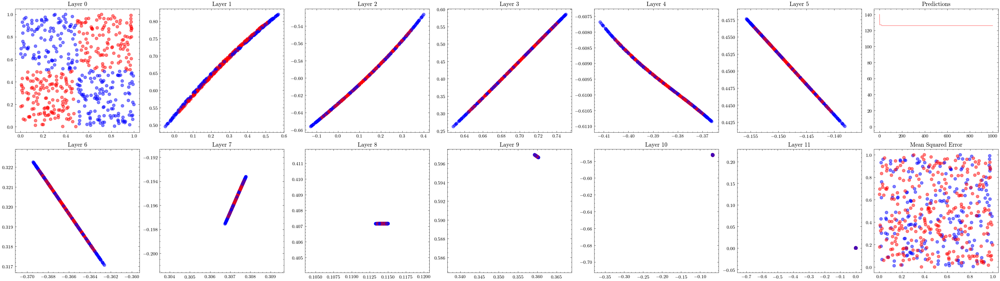

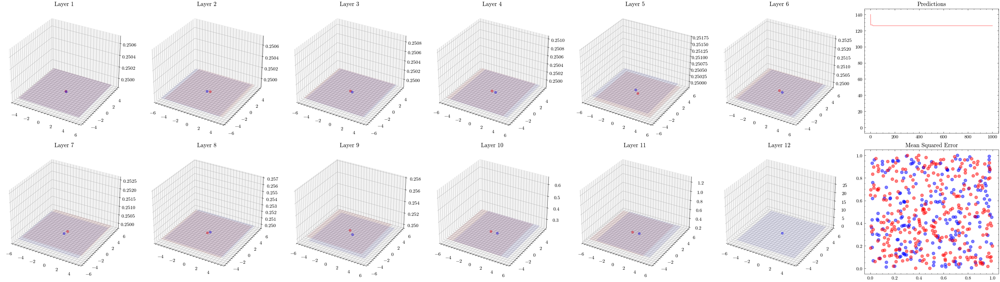

In [9]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
torch_model = TorchNet(num_hidden_layers=10).to(device)

rows = 2
cols = 7

X_tensor = torch.tensor(X, device=device, dtype=torch.float32).squeeze(-1)
y_tensor = torch.tensor(y, device=device, dtype=torch.float32).squeeze(-1)

epochs = 1001
learning_rate = 0.005

width_scale = 4
height_scale = 2

transformations_plot_filename = "vanishing_gradients/layers_12.gif"
loss_landscape_plot_filename = "vanishing_gradients/layers_12_loss_landscape.gif"
torch_fit(
    torch_model,
    X_tensor,
    y_tensor,
    epochs,
    learning_rate,
    transformations_plot_filename,
    loss_landscape_plot_filename,
    device,
    rows=rows,
    cols=cols,
    width_scale=width_scale,
    height_scale=height_scale,
)

In the visualizations below, we see the earlier layers not updating at all from vanishing gradients.

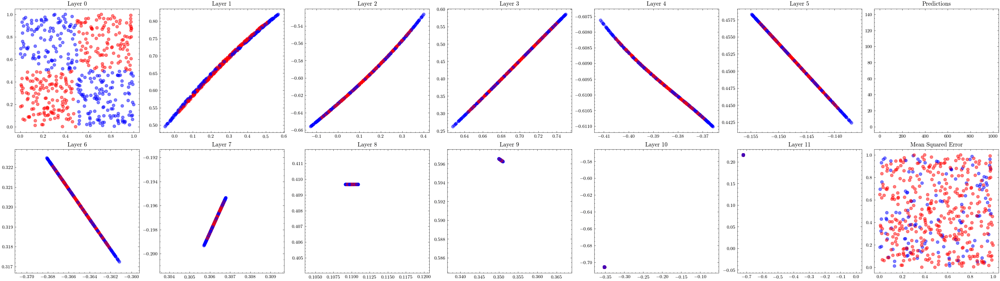

In [10]:
Image(filename=transformations_plot_filename)

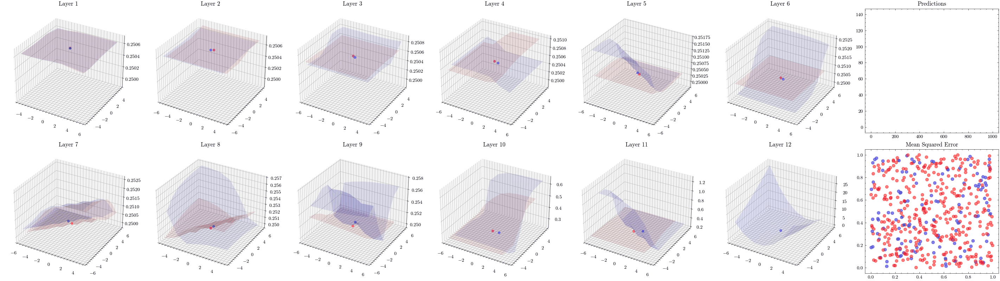

In [11]:
Image(filename=loss_landscape_plot_filename)